# Coursework 2: Learning with Images
_COMP0169 Team_

__Niloy J. Mitra & Tobias Ritschel__

TAs:  __Luca Morreale, Pradyumna Reddy, Sanjeev Muralikrishnan & Animesh Karnewar__

The total points for this exercise are 100.

Please refer to Moodle submission page for the due date.


# Submission:

Coursework submissions must comprise of this **single** jupyter notebook, containing your code and written comments. Cells that need to be changed are clearly stated with a &#9998; symbol and you are not allowed to change the rest of the code in any ways. Descriptive answers must be contained in the markdown blocks starting with "_Your reply_:". Code must only be written in the space inside the `#solution ... #end_solution` blocks. Code written outside these blocks will not be processed or evaluated. However, feel free to change and experiment with various hyperparameters.

Note that only the imported packages are allowed to be used. 

In case you are suspected of plagiarism you might be requested to present your work in a one-to-one session (date to be decided) demonstrating what you have implemented.

**Questions:**

[Question 1](#question1): Image, audio; all the same (20 points)

[Question 2](#question2): Denoising (35 points)

[Question 3](#question3): Auto-encoder and Variational AutoEncoder (45 points)

## Datasets

All the datasets must be contained in the `Datasets` folder at the same level of the notebook.
In this courswork you are going to use MNIST, CelebA-HQ, audio data and noisy images. Each dataset is used in a specific exercise. The data paths are already present in the code, please **do not** change them.

![cw2.png](attachment:cw2.png)

## Trained Models zip for marking

Once you are done with the assignment, create a zip file of your trained models and share an storage link the below cell:

&#9998; <font color="#0047AB">
https://drive.google.com/file/d/1ZLKKBkj-OTLHB18QuLpNPXuW1qq7nv3-/view?usp=sharing
</font>

_Your reply_:

## Packages

The following cell imports all packages needed in the coursework. You are not allowed to use any other packages than the ones listed below.
<a name='packages'></a>

In [1]:
import IPython
import numpy as np
import torch
import random
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.nn import Module
from torchvision import datasets, transforms
from torch.autograd import Variable
import cv2
from skimage.metrics import peak_signal_noise_ratio
import os
from pathlib import Path
import torchvision
import PIL
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
import torchvision.transforms.functional as TF
import scipy
from tqdm.auto import tqdm
from torchvision.utils import make_grid
from scipy.io.wavfile import read

In [2]:
# install prettytable and uncomment to use count_paramters function
from prettytable import PrettyTable

In [ ]:
# install livelossplot and uncomment below to plot losses live (while training) <- highly suggested
# !pip install livelossplot
from livelossplot import PlotLosses

In [ ]:
# !wget https://geometry.cs.ucl.ac.uk/mlvc/courseworks/Datasets_v2.zip 
# !unzip Datasets_v2.zip -d './Datasets'
# !unzip Datasets_v2.zip

In [ ]:
# If using collab, uncomment the lines below and temporarily modify the paths in the notebook appropriately
# And revert the paths to what they were while submitting.
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


Set random seed

In [5]:
np.random.seed(42)
torch.manual_seed(42)
random.seed(42)

Set device

In [6]:
# setting device on GPU if available, else CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cpu


Create folders for 1. saving models and 2. saving visual logs.

In [7]:
models_dir = Path("./models")
logs_dir = Path("./logs")

models_dir.mkdir(parents=True, exist_ok=True)
logs_dir.mkdir(parents=True, exist_ok=True)

### Utility functions

In [8]:
def plot_images(images, titles, texts):
    N_cols = len(images)
    N_rows = len(images[0])
    
    fig, axs = plt.subplots(N_rows, N_cols, figsize=(20, 15))
    
    if titles is not None:
        for i, ax in enumerate(axs[0]):
            ax.set_title(titles[i])
    
    for i, img_col in enumerate(images):
        for j, img in enumerate(img_col):
            if len(img.shape) == 2:
                axs[j,i].imshow(img, interpolation='nearest', cmap='gray')
            else:
                axs[j,i].imshow(img, interpolation='nearest')
            axs[j,i].axis('off')
            if texts is not None:
                axs[j,i].text(0.5,-0.1, str(texts[j][i])[:4], size=10, ha="center", transform=axs[j,i].transAxes)
    plt.show()

def l1_loss(x, y):
    return np.mean(np.abs(x-y))

def count_parameters(model):
    # you can use this function to print number parameters per layer
    # install prettytable and uncomment import to use count_paramters function
    table = PrettyTable(["Modules", "Parameters"])
    total_params = 0
    for name, parameter in model.named_parameters():
        if not parameter.requires_grad:
            continue
        param = parameter.numel()
        table.add_row([name, param])
        total_params+=param
    print(table)
    print(f"Total Trainable Params: {total_params}")
    return total_params

def plot_fftfreq(frequency, amplitude_before_filtering, amplitude_after_filtering=None): 
    plt.figure(figsize=(20,5))
    plt.ylabel("Amplitude")
    plt.xlabel("Frequency")
    plt.plot(frequency, np.abs(amplitude_before_filtering), label='before')
    
    if type(amplitude_after_filtering) != type(None):
        plt.plot(frequency, np.abs(amplitude_after_filtering), label='after')
    
    plt.legend()
    plt.show()

def plot_waveform(input_audio, filtered_audio):
    plt.figure(figsize=(20,5))
    plt.title("Input (red) and Output (green)")
    plt.plot(input_audio, c='r', label='input')
    plt.plot(filtered_audio, c='g', label='output')
    plt.show()

def plot_images_horizontal(imgs):
    num_imgs = len(imgs)
    f = plt.figure(figsize=(40, 15))
    for i in range(num_imgs):
        f.add_subplot(1, num_imgs, i+1)
        plt.imshow(imgs[i])
    plt.show()

## 1. Image, audio; all the same (20 points)
<a name='question1'></a>

[a)](#question1a) Implement a filter to remove low temporal frequencies from the audio file `audio_clip.wav`, provided under `Datasets/Filtering/` (loading code is already provided). Implement a version using FFT (`highpass_fft_filter_audio`)(**2 points**) and a version using moving average (`highpass_normal_filter_audio`) (**2 points**), discuss which version, when and why is better (**1 points**).

[b)](#question1b) Implement a filter to find vertical edges in an image. We provide a sample file `image.png` under
`Datasets/Filtering/` for testing. Apply your filter to this image. (**8 points**) Implement the filter without for loops (**2 points**).

[c)](#question1c) Implement a function to modify an image such that the modified image is visually different from the original but has the same output as the original when you perform edge detection.(**5 points**).

(Reference example: One of the changes that we implemented yields an L1 distance of 84.993 between the original image and the modified image, while has 0.0 L1 distance between the filtered outputs of both.)

**Question 1.a**
<a name='question1a'></a>

Implement a filter to remove low temporal frequencies

<font color='red'>Hint:</font> use "fft", "fftfreq" functions from "np.fft".


&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [11]:
def highpass_fft_filter_audio(audio):
    #solution

    fft = np.fft.fft(audio)
    frequencies = np.fft.fftfreq(len(audio))
    
    amplitude_before_filtering = abs(fft)

    fft[np.abs(frequencies) < 0.025] = 0  # setting the treshold 0.025

    amplitude_after_filtering = abs(fft)

    filtered_audio = np.fft.ifft(fft)

    #end_solution
    return filtered_audio, frequencies, amplitude_before_filtering, amplitude_after_filtering

In [22]:
def highpass_normal_filter_audio(audio):
    filtered_audio = None
    #solution
    window_size = 11
    padded_audio = np.zeros(audio.shape[0] + window_size)
    padded_audio[window_size // 2 : (-window_size // 2)] = audio  # padding with zeros
    moving_average = np.zeros_like(audio)
    for i in range(len(audio)):
      moving_average[i] = np.mean(padded_audio[i : i + window_size])

    # Subtract the moving average from the audio data to apply high pass filter
    filtered_audio = audio - moving_average
    #end_solution
    return filtered_audio

Load  audio from file

In [13]:
# load input_audio from input_audio_filename
input_audio_filename = "./Datasets/Filtering/audio_clip.wav"
audio_rate, input_audio = scipy.io.wavfile.read(input_audio_filename)
print(f"Audio array shape: {input_audio.shape}")
print(f"Since the audio clip contains stereo (2) channels, we only use the first one")
input_audio = input_audio[:, 0]
print(f"Input audio shape: {input_audio.shape}")
IPython.display.Audio(input_audio, rate=audio_rate)

Audio array shape: (90000, 2)
Since the audio clip contains stereo (2) channels, we only use the first one
Input audio shape: (90000,)


Run filtering with input data 

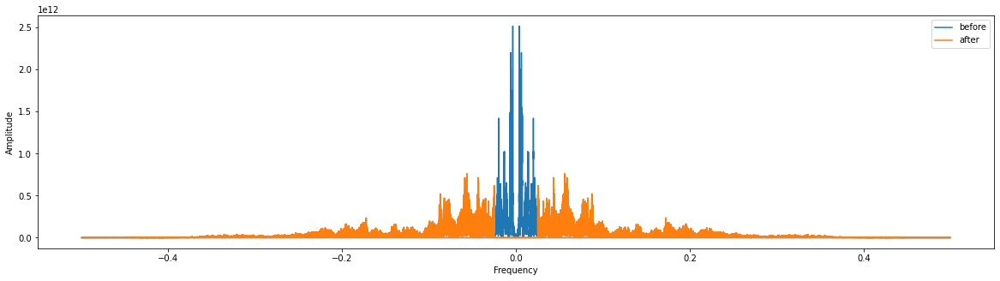

/usr/local/lib/python3.8/dist-packages/matplotlib/cbook/__init__.py:1317: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


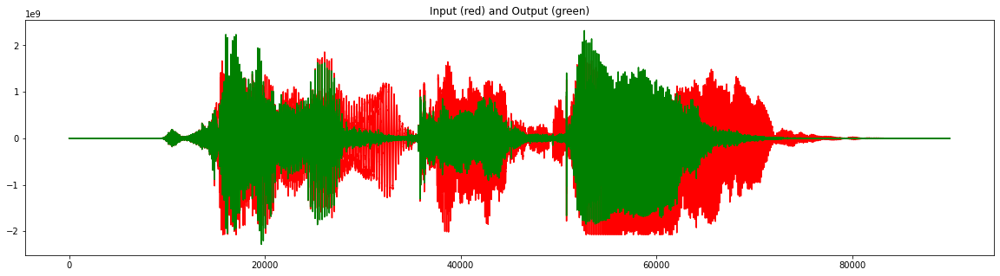

In [14]:
#begin_test
filtered_audio, frequencies, amplitude_before_filtering, amplitude_after_filtering = highpass_fft_filter_audio(input_audio)
plot_fftfreq(frequencies, amplitude_before_filtering, amplitude_after_filtering)
plot_waveform(input_audio, filtered_audio)
#end_test

In [15]:
print("Original audio")
IPython.display.Audio(input_audio, rate=audio_rate)

Original audio


In [16]:
print("Filtered audio")
IPython.display.Audio(filtered_audio, rate=audio_rate)

Filtered audio


/usr/local/lib/python3.8/dist-packages/IPython/lib/display.py:158: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


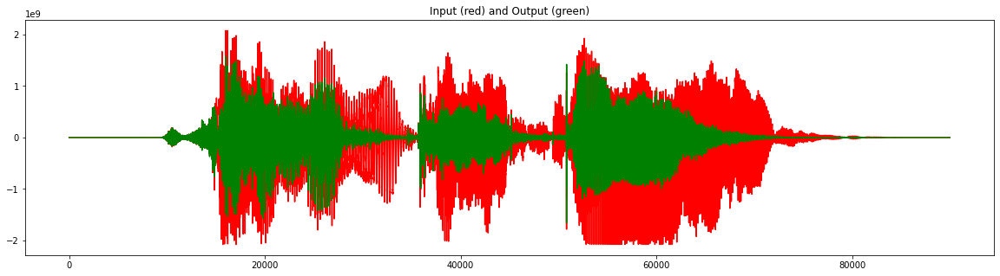

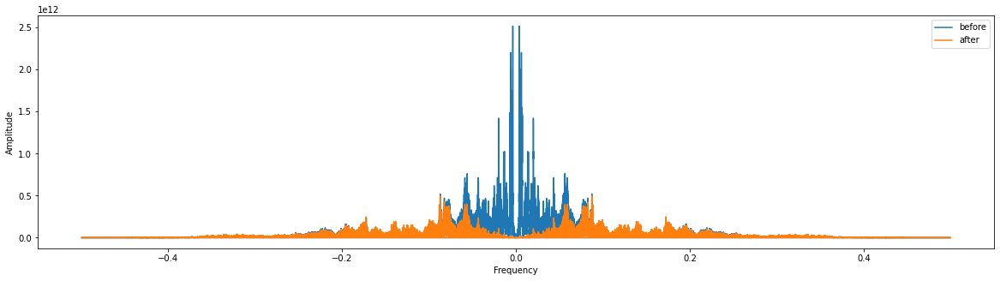

In [23]:
#begin_test
filtered_audio = highpass_normal_filter_audio(input_audio)
plot_waveform(input_audio, filtered_audio)

# plotting fft representation of the filtered signal
_, frequencies_normal, amplitude_before_filtering_normal, _ = highpass_fft_filter_audio(filtered_audio)
plot_fftfreq(frequencies_normal, amplitude_before_filtering, amplitude_before_filtering_normal)
#end_test

In [ ]:
#begin_test
#end_test

In [24]:
print("Original audio")
IPython.display.Audio(input_audio, rate=audio_rate)

Original audio


In [25]:
print("Filtered audio")
IPython.display.Audio(filtered_audio, rate=audio_rate)

Filtered audio


Discuss which version is better when and why? 

&#9998; <font color="#0047AB">
The version using FFT to achieve high pass filtering is a better solution when the efficiency is more important. Another advantage of using this implementation is that you can work with different tresholds based on the requirements (e.g. in some situation we want to cut all noise below X frequency). A disadvantage is that the fft solution only works for periodic input signal which can not be present in certain situations. <br>
The moving average solution has the advantage of being simple and faster to implement. However, a disadvantage is that moving average has a delay because it consists of the average of all the values inside the moving window, therefore not being the perfect choice when a immediate real-time reaction is needed.
</font>

_Your reply_:

**Question 1.b**
<a name='question1b'></a>

Implement a filter to find vertical edges in an image

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [26]:
def detect_vertical_edges(image):
    #solution
    gray_img = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) / 255

    filtered_image = gray_img.copy()
    kernel = np.array([[1, 0, -1], [1, 0,-1], [1, 0, -1]])

    padding = kernel.shape[0] // 2  # padding the image with this value
    padded_image = np.zeros([gray_img.shape[0] + 2 * padding, gray_img.shape[1] + 2 * padding])
    padded_image[padding : (-padding), padding : (-padding)] = gray_img  # the padded image

    filtered_image = np.zeros_like(gray_img)

    # Applying the kernel filter all over the original image
    for i in range(gray_img.shape[0]):
      for j in range(gray_img.shape[1]):
        filtered_image[i, j] = np.sum(padded_image[i : i + kernel.shape[0], j : j + kernel.shape[0]] * kernel)

    #end_solution

    return filtered_image

In [27]:
input_image_filename = "./Datasets/Filtering/image.png"

Run filter over the input image

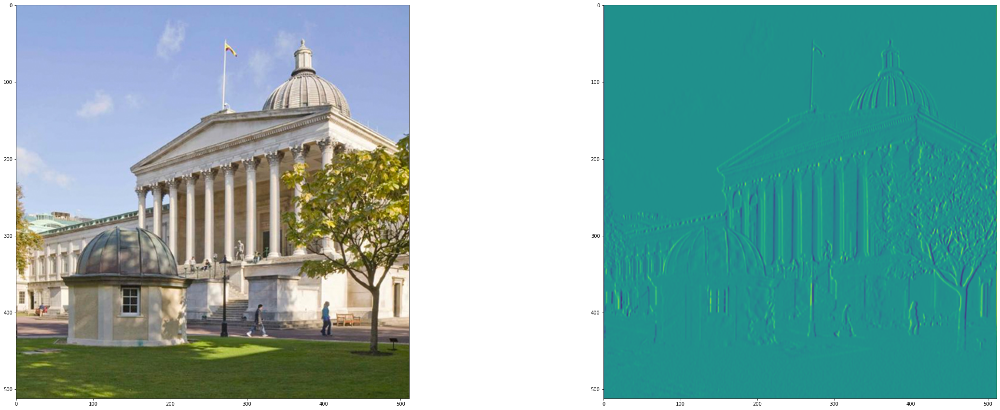

In [28]:
#begin_test
input_image = np.asarray(PIL.Image.open(input_image_filename).convert('RGB'))
filtered_image = detect_vertical_edges(input_image)
plot_images_horizontal([input_image, filtered_image])
#end_test

In [ ]:
#begin_test
#end_test

**Question 1.c**
<a name='question1c'></a>

Modify the input image such that it is visually different from the original but has the same output when you perform edge detection. Ideal value for L1_loss between filtered_image and filtered_modified_image is 0.0, but your modification can/should try to minimize this distance as much as possible.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [29]:
def modify_image(input_image):
    #solution
    # My solution is to swap the RGB channels to BGR
    # Therefore the image is visually different and because the gray conversion
    # has the same value, the convolution will produce the same result
    input_modified = cv2.cvtColor(input_image, cv2.COLOR_RGB2BGR)
    #end_solution

    return input_modified

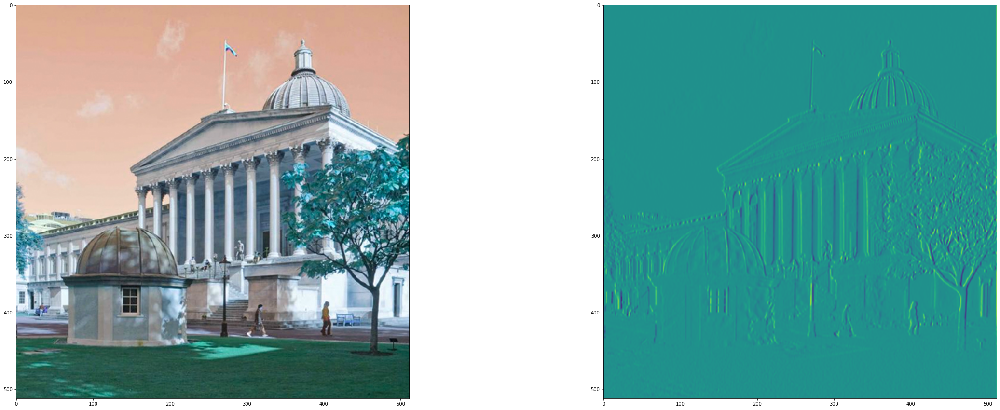

L1 distance between original and modified image: 84.99381510416667
L1 distance between filtered and modified filtered image: 0.008540972541360313


In [30]:
#begin_test
input_modified = modify_image(input_image)
filtered_modified_image = detect_vertical_edges(input_modified)
plot_images_horizontal([input_modified, filtered_modified_image])
print(f"L1 distance between original and modified image: {l1_loss(input_image, input_modified)}")
print(f"L1 distance between filtered and modified filtered image: {l1_loss(filtered_image, filtered_modified_image)}")
#end_test

In [ ]:
#begin_test
#end_test

## 2. Denoising (35 points)
<a name='question2'></a>

[a)](#question2a) Implement `denoiseGauss(image)` to denoise the image noisy `image.png` under `Filtering/` using a
5×5 Gaussian filter. (**5 points**)

[b)](#question2b) Implement a pyramidal encoder-decoder to denoise an image. We provide you pairs of noisy and
noise-free image patches of size 128×128 for training and testing, under `Datasets/Denoising/`. You may use all the infrastructure of `Pytorch`. The encoder and decoder must have at least 3 layers each. Please use ReLU non-linearities after each layer (**15 points**).
Please train for no more than 400 epochs.

[c)](#question2c) Given the comparison between the Gaussian-kernel denoising and encoder-decoder denoising
methods, discuss which method performs better and where. You should write no more than half a page. (**5 points**)

[d)](#question2d) Modify the first noisy image from the training set such that it follows the distribution of the domain data (i.e. looks like the noisy images from the training set), but when passed through the trained AE denoiser, yields poor PSNR which is comparable to the gaussian denoiser's performance (**8 points**). Explain your approach in brief (**2 points**). Write no more than 8 sentences.

(Reference example: Given a random noisy image X sampled from our dataset the PSNR value of the output of the trained denoising network on X was 22db we were able to estimate an adverserial example X_adv whose MSE with X is 0.0023 and 0.0043 for two different runs, the outputs of denoising X_adv with the same network have a PSNR of 16.69db and 14.91db respectively.)


**Question 2.a**
<a name='question2a'></a>

Implement the function to denoise the image

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [38]:
def gkern(l=5, sig=1.):
    
    #solution

    k = l // 2
    
    # Generating a gaussian distribution
    probs = [np.exp(-z*z/(2*sig*sig))/np.sqrt(2*np.pi*sig*sig) for z in range(-k,k+1)] 
    
    # Generating the kernel by assigning the outer product of this distribution with itself
    out_kernel = np.outer(probs, probs)

    #end_solution

    
    return out_kernel

def denoise_gauss(image):
    
    #solution
    kernel = gkern(5, 1)
    padding = kernel.shape[0] // 2  # number of pixels of the padding on each side
    padded_image = np.zeros([image.shape[0] + 2 * padding, image.shape[1] + 2 * padding, image.shape[2]])
    padded_image[padding : (-padding), padding : (-padding), :] = image  # getting the padded image

    denoised_image = np.zeros_like(image)

    # Applying the filter all over the image
    for i in range(image.shape[0]):
      for j in range(image.shape[1]):
        denoised_image[i, j, 0] = np.sum(padded_image[i : i + kernel.shape[0], j : j + kernel.shape[0], 0] * kernel)
        denoised_image[i, j, 1] = np.sum(padded_image[i : i + kernel.shape[0], j : j + kernel.shape[0], 1] * kernel)
        denoised_image[i, j, 2] = np.sum(padded_image[i : i + kernel.shape[0], j : j + kernel.shape[0], 2] * kernel)
    #end_solution

    
    return denoised_image

Load input image from file

In [39]:
noisy_image_filename = "./Datasets/Filtering/noisy_image.png"

Filter the input image

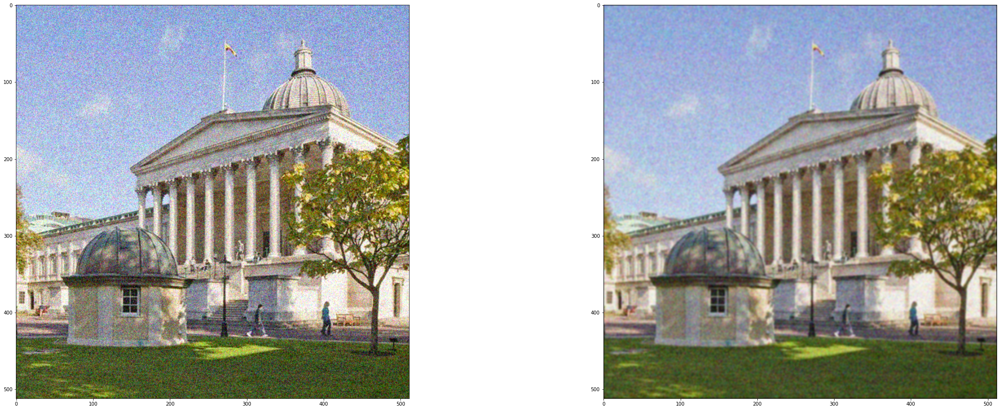

In [40]:
noisy_image = np.asarray(PIL.Image.open(noisy_image_filename).convert('RGB'))
denoised_image = denoise_gauss(noisy_image)
plot_images_horizontal([noisy_image, denoised_image])

**Question 2.b**
<a name='question2b'></a>

Implement dataset class below. Note that the images output by the `DenoisingDB` dataset should be of size 128 x 128. Crop the original images at the top left corner to get the aforementioned size.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [43]:
class DenoisingDB(Dataset):
    
    def __init__(self, input_imgs_path, cleaned_imgs_path):
        super().__init__()
        
        #solution
        self.train_images = []
        self.target_images = []

        self.transforms = transforms.Compose([
                        transforms.ToPILImage(),
                        transforms.ToTensor()
                    ])

        for image in input_imgs_path.iterdir():  # getting the train input images
            img = np.asarray(PIL.Image.open(image))
            img = img[:128, :128] / 255  # crop top-left corner
            img = np.reshape(img, img.shape[0] * img.shape[1])
            self.train_images.append(img)

        for image in cleaned_imgs_path.iterdir():  # getting the target images
            img = np.asarray(PIL.Image.open(image))
            img = img[:128, :128] / 255  # crop top-left corner
            img = np.reshape(img, img.shape[0] * img.shape[1])
            self.target_images.append(img)
        
        #end_solution


    def __len__(self):
        
        #solution
        length = len(self.train_images)
        #end_solution

        
        return length

    def __getitem__(self, idx):
        
        #solution
        input_image = self.train_images[idx][:]
        input_image = np.asarray(input_image).astype(np.float32).reshape((128, 128))
            
        target_image = self.target_images[idx][:]
        target_image = np.asarray(target_image).astype(np.float32).reshape((128, 128))

        if self.transforms:  # apply transformation to torch
            input_image = self.transforms(input_image)
            target_image = self.transforms(target_image)

        #end_solution

        
        return (input_image, target_image)

Implement the Encoder network:

Note that the `Encoder` and `Decoder` networks need to be sufficiently large for performing the denoising task successfully. We suggest 5 levels and double the number of internal feature-maps when reducing the spatial resolution with use of ReLU non-linearities. But feel free experiment with different layers, blocks and operations.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [44]:
class Encoder(Module):
    
    def __init__(self):
        super(Encoder, self).__init__()
        
        #solution
        self.enc1 = nn.Conv2d(1, 512, kernel_size=3, padding=1)
        self.enc2 = nn.Conv2d(512, 256, kernel_size=3, padding=1)
        self.enc3 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
        self.enc4 = nn.Conv2d(128, 64, kernel_size=3, padding=1)

        self.bn1 = nn.BatchNorm2d(512)
        self.bn2 = nn.BatchNorm2d(256)
        self.bn3 = nn.BatchNorm2d(128)
        self.bn4 = nn.BatchNorm2d(64)        
        self.pool = nn.MaxPool2d(2, 2)
        #end_solution


    def forward(self,high_res_image):
        
        #solution
        x = F.relu(self.enc1(high_res_image))
        x = self.bn1(x)
        x = self.pool(x)
        x = F.relu(self.enc2(x))
        x = self.bn2(x)
        x = self.pool(x)
        x = F.relu(self.enc3(x))
        x = self.bn3(x)
        x = self.pool(x)
        x = F.relu(self.enc4(x))
        x = self.bn4(x)
        low_res_image = self.pool(x)
        #end_solution

        
        return low_res_image

Implement the Decoder network:

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [45]:
class Decoder(Module):

    def __init__(self):
        super(Decoder, self).__init__()
        
        #solution
        self.dec1 = nn.ConvTranspose2d(64, 64, kernel_size=2, stride=2)  
        self.dec2 = nn.ConvTranspose2d(64, 128, kernel_size=2, stride=2)
        self.dec3 = nn.ConvTranspose2d(128, 256, kernel_size=2, stride=2)
        self.dec4 = nn.ConvTranspose2d(256, 512, kernel_size=2, stride=2)
        self.out = nn.Conv2d(512, 1, kernel_size=3, padding=1)

        self.bn1 = nn.BatchNorm2d(512)
        self.bn2 = nn.BatchNorm2d(256)
        self.bn3 = nn.BatchNorm2d(128)
        self.bn4 = nn.BatchNorm2d(64)        
        self.pool = nn.MaxPool2d(2, 2)
        #end_solution


    def forward(self, low_res_image):
        
        #solution
        x = F.relu(self.dec1(low_res_image))
        x = (self.bn4(x))
        x = F.relu(self.dec2(x))
        x = (self.bn3(x))
        x = F.relu(self.dec3(x))
        x = (self.bn2(x))
        x = F.relu(self.dec4(x))
        x = (self.bn1(x))
        denoised_image = torch.sigmoid(self.out(x))
        #end_solution

        
        return denoised_image

Implement the reconstruction loss

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [47]:
def loss_function(prediction, target):
    
    #solution
    loss = torch.mean((prediction - target)**2)  #MSE
    #end_solution

    
    return loss

Paths to input data

In [48]:
input_imgs_path = Path("./Datasets/Denoising/input_noisy_images")
cleaned_imgs_path = Path("./Datasets/Denoising/target_clean_images")

Write the training loop

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

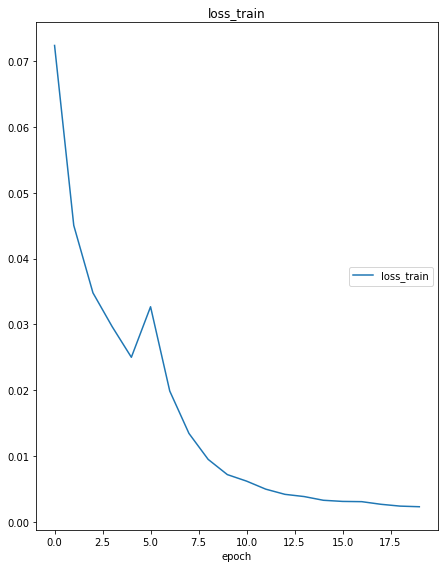

loss_train
	loss_train       	 (min:    0.002, max:    0.072, cur:    0.002)


In [50]:
docs_dataset = DenoisingDB(input_imgs_path, cleaned_imgs_path)

encoder = Encoder().to(device)
decoder = Decoder().to(device)

#solution

NUM_EPOCHS = 20

flag = True

# Need one optimizer for each model
o1 = optim.Adam(encoder.parameters(), lr=1e-3)
o2 = optim.Adam(decoder.parameters(), lr=1e-3)

liveloss = PlotLosses()

for epoch in range(NUM_EPOCHS):
    running_loss = 0.0
    logs = {}
    for (image, target) in docs_dataset:
            
        img = image[None, ...] # add batch dimension None because I am not using DataLoader
        labels = target[None, ...]  #add batch dimension
        img = img.to(device)
        labels = labels.to(device)
        o1.zero_grad()  # setting gradients to zero
        o2.zero_grad()
        encoded = encoder(img)  # encoding the image
        decoded = decoder(encoded)  # decoding the image
        loss = loss_function(decoded, labels)  # determine loss
        # backpropagation
        loss.backward()
        # update the parameters
        o1.step()
        o2.step()
        running_loss += loss.detach().item()
    
    logs['loss_train'] = running_loss / len(docs_dataset)
    liveloss.update(logs)
    liveloss.send()



Save the model (needed for marking)

In [65]:
torch.save({"encoder":encoder, "decoder":decoder}, "models/ex2b.pth")

Load trained model

In [ ]:
state_dict = torch.load("models/ex2b.pth")
encoder = state_dict["encoder"].to(device)
decoder = state_dict["decoder"].to(device)

Plot 5 input images and their relative denoised images side by side.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

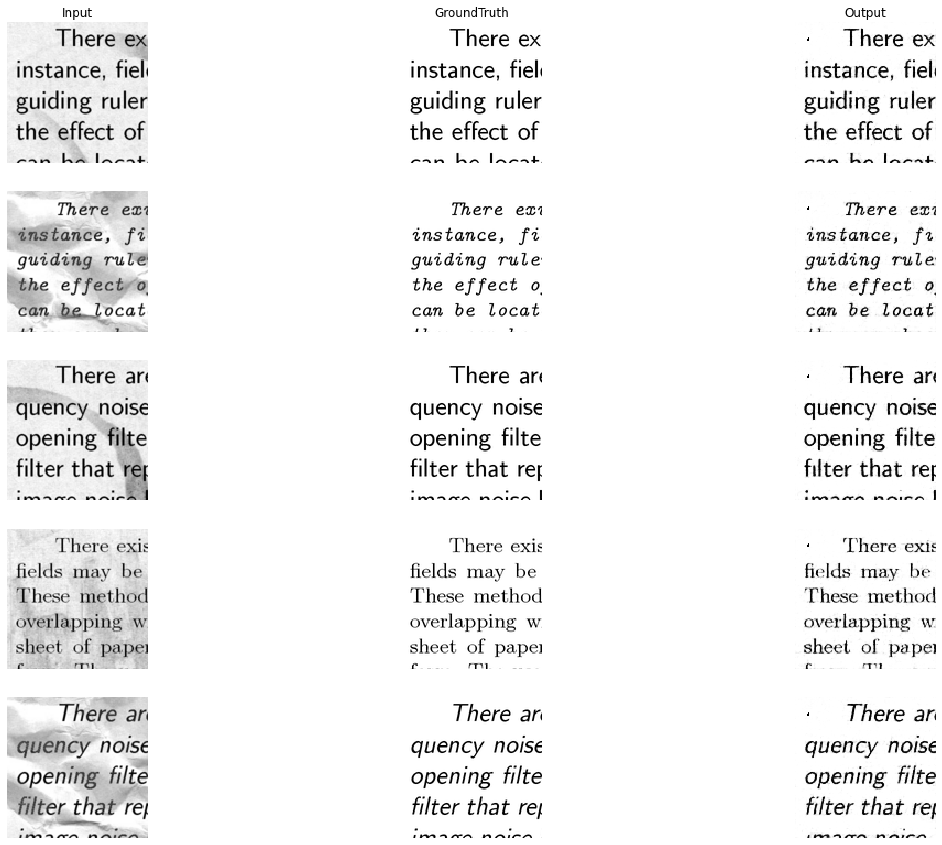

In [51]:
input_imgs, gt_imgs, output_imgs = [], [], []
#solution
docs_dataset = DenoisingDB(input_imgs_path, cleaned_imgs_path)
index = 0
for (image, target) in docs_dataset:
    img = image[None, ...]
    labels = target[None, ...]
    img = img.to(device)
    labels = labels.to(device)

    encoded = encoder(img)
    decoded = decoder(encoded)

    input = image.detach().numpy()
    input = np.squeeze(input, axis=0)

    gt = target.detach().numpy()
    gt = np.squeeze(gt, axis=0)

    output = decoded.permute(0, 2, 3, 1).detach().cpu().squeeze().numpy()

    input_imgs.append(image.permute(1, 2, 0).cpu().numpy().squeeze())
    gt_imgs.append(target.permute(1, 2, 0).cpu().numpy().squeeze())
    output_imgs.append(decoded.permute(0, 2, 3, 1).detach().cpu().squeeze().numpy())
    
    index += 1
    if index == 5:
        break

#end_solution

titles = ['Input', 'GroundTruth', 'Output']
plot_images([input_imgs, gt_imgs, output_imgs], titles, None)


**Question 2.c**
<a name='question2c'></a>

Compute images for both the AE and Gaussian Kernels algorithm from `images`.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [60]:
dataset = DenoisingDB(input_imgs_path,cleaned_imgs_path)

images = [docs_dataset[i][0].to(device) for i in range(5)]
targets = [docs_dataset[i][1].to(device) for i in range(5)]
images_ae = []
images_gauss = []

# your solution should populate the `images_ae` and `images_gauss` lists with the required 5 image outputs
#solution
for image in images:
    ae_imgage = decoder(encoder(image[None, ...]))
    ae_out = ae_imgage.permute(0, 2, 3, 1).detach().cpu().squeeze().numpy()

    input_image = image.permute(1, 2, 0).cpu().squeeze().numpy()
    rgb_input_image = np.zeros([input_image.shape[0], input_image.shape[1], 3])
    rgb_input_image[:, :, 0] = input_image
    rgb_input_image[:, :, 1] = input_image
    rgb_input_image[:, :, 2] = input_image

    rgb_gauss_image = denoise_gauss(rgb_input_image)
    gauss_image = rgb_gauss_image[:, :, 0].reshape(input_image.shape)

    images_ae.append(ae_out)
    images_gauss.append(gauss_image)

#end_solution



In [61]:
# Plot images and PSNR
imgs_plot = [ el.detach().squeeze().cpu().numpy() for el in images]
tgts_plot = [ el.detach().squeeze().cpu().numpy() for el in targets]

<ipython-input-62-afbb5353e076>:4: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im_true.
  pnsr_gauss = peak_signal_noise_ratio(tgts_plot[i], images_gauss[i])


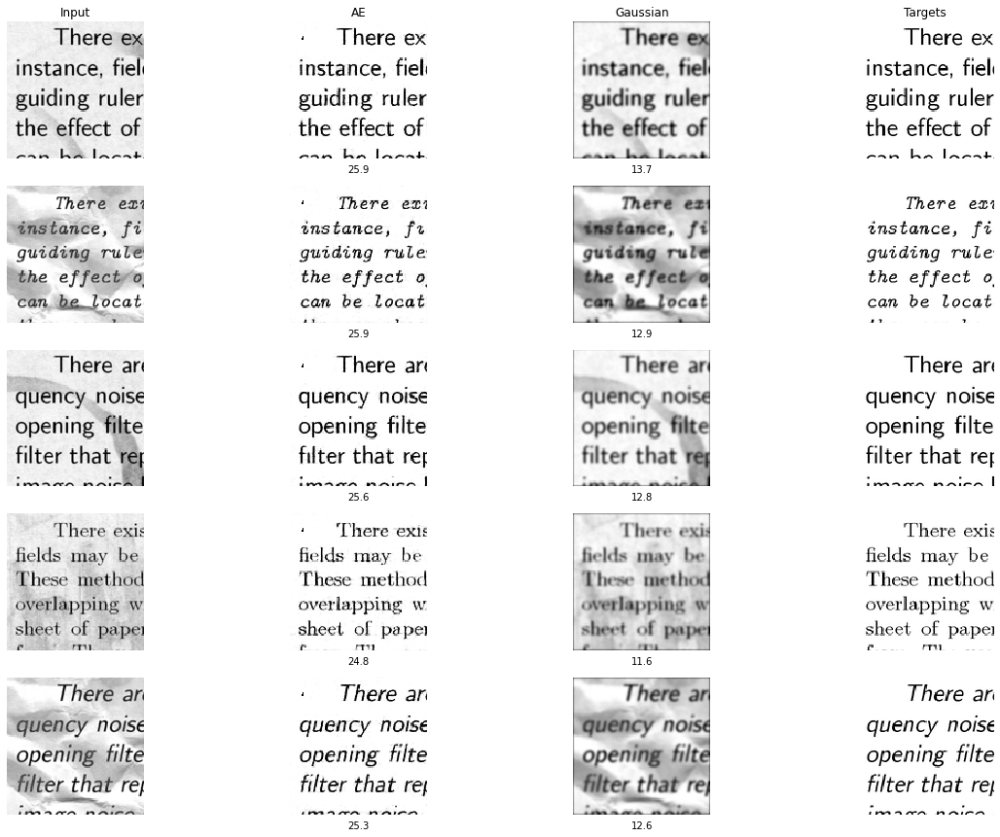

In [62]:
psnrs = [ 0.0 for el in targets ]
for i in range(len(tgts_plot)):
    psnr_ae    = peak_signal_noise_ratio(tgts_plot[i], images_ae[i])
    pnsr_gauss = peak_signal_noise_ratio(tgts_plot[i], images_gauss[i])
    psnrs[i] = ['', psnr_ae, pnsr_gauss, '']

img = [imgs_plot, images_ae, images_gauss, tgts_plot]
titles = ['Input', 'AE', 'Gaussian', 'Targets']
texts = psnrs
plot_images(img, titles, texts)
plt.show()

Discuss which method performs better:

&#9998; <font color="#0047AB">
I believe that the encoder-decoder solution is better for supervised learning, while the gauss-kernel is a better method for unsupervised learning. The encoder-decoder solution for image denoising is more accurate and flexible. First of all, this method is flexible to the different types of noise that can be found inside the input image as the model learns how to eliminate it, therefore leaning to adapt it's parameter to the different types of noise we train our model on. Meanwhile, the gaussian-kernel does not learn how to deal with a specific type of noise (like unwrapped paper noise) as it applies the same blurr on every type of image. <br>
Therefore, the encoder-decoder is a better solution when we know the type of noise the input has and train our model on it, learning how to eliminate it. This solution requires supervised learning as we need a dataset with input images and target images. <br>
On the other hand, gaussian-kernel is much faster to implement. This solution is better when the learning is unsupervised and we do not know what pattern the noise might have. This blurring method is universal, and can be applied on every image and do the same thing: blurring the image.
</font>

_Your reply_:

**Question 2.d**
<a name='question2d'></a>

Use the cell below to modify the `adversarial_image` variable: 

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [190]:
adversarial_image = torch.stack(images, dim=0).to(device)[-1:]
adversarial_target = torch.stack(targets, dim=0).to(device)[-1:]

# Your solution should update (modify) the `adversarial_image` variable above.
# After modification, it should still be torch.Tensor of shape [1 x 1 x 128 x 128]
#solution

# My solution is applying the FGSM adversary attack
loss_fn = nn.MSELoss()

# Getting the output of the model requiring the gradient
output_adversarial = decoder(encoder(adversarial_image.requires_grad_(True)))

loss = loss_fn(output_adversarial, adversarial_target)

# Getting the sign of the gradient
sign_grad = torch.autograd.grad(loss, adversarial_image)[0].sign()

# Adding the noise
adversarial_image = adversarial_image + 0.08 * sign_grad
adversarial_image = torch.relu(adversarial_image)
adversarial_image = adversarial_image.detach()

#end_solution


Compute the performance of the `adversarial` image on AE denoiser and Gaussian-kernel denoiser

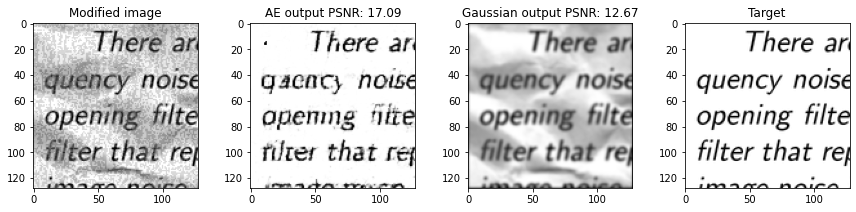

MSE between original and adversarial image:  tensor(0.0064)


In [192]:
original_image = torch.stack(images, dim=0).to(device)[-1:]
ae_prediction = decoder(encoder(adversarial_image))
ae_out = ae_prediction.permute(0, 2, 3, 1).detach().cpu().squeeze().numpy()

image_np = image.squeeze().cpu().numpy()
image_np = np.tile(image_np[:,:,None], (1,1,3))
gauss_out = denoise_gauss(image_np)[:,:,0]

adv_img = adversarial_image[0].permute(1, 2, 0).cpu().numpy()
target = adversarial_target[0].permute(1, 2, 0).cpu().numpy()

psnr_ae = peak_signal_noise_ratio(adversarial_target[0, 0].cpu().numpy(), ae_out)
psnr_gauss = peak_signal_noise_ratio(adversarial_target[0, 0].cpu().numpy(), gauss_out)

fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(12, 4))
ax1.set_title("Modified image")
ax1.imshow(adv_img[:, :, 0], cmap="gray") 
ax2.set_title(f"AE output PSNR: {psnr_ae :.2f}")
ax2.imshow(ae_out, cmap="gray") 
ax3.set_title(f"Gaussian output PSNR: {psnr_gauss :.2f}")
ax3.imshow(gauss_out, cmap="gray") 
ax4.set_title("Target")
ax4.imshow(target[:, :, 0], cmap="gray") 

plt.tight_layout()
plt.show()
print('MSE between original and adversarial image: ', ((original_image-adversarial_image)**2).mean())

Explain your approach below:

&#9998; <font color="#0047AB">
I am using a FGSM adversarial attack, by adding noise to the image based on the gradients from every pixel. The gradient directions (signs), are determined using the loss function of the result image of the model.
</font>

_Your reply_:

## 3. Auto-encoder and Variational Auto-encoder (45 points)
<a name='question3'></a>

[a)](#question3a) Implement a convolutional auto-encoder (AE). You can make use of convolution, pooling, batchnorm layers (feel free to use any differentiable operations that `PyTorch` provides). Implement Dataset classes for loading the MNIST and CelebA-HQ dataset. And implement the loss function. The loss between input and output should be **L2**. (**15 points**) $$||I −dec(enc(I))||^2_2$$

[b)](#question3b) Train your defined AE on MNIST dataset. Please train for no more than 100 epochs. (**5 points**)
Test its reconstruction performance on random 5 samples of the validation split by showing the input and the AE reconstruction, side-by-side.

[c)](#question3c) Train your defined AE on CelebAHQ dataset. Please train for no more than 400 epochs. (**5 points**) Test its reconstruction performance on random 5 samples of the validation split by showing the input and the AE reconstruction, side-by-side.

[d)](#question3d) Implement a Variational Auto-Encoder (VAE) and train it on CelebA-HQ. Implement the VAE ELBO (Evidence Lower Bound) loss. Show 10 random images sampled from the VAE you trained. (**10 points**)
Please train it for no longer than 400 epochs.

[e)](#question3e) i. Compare the reconstruction performance of AE v/s VAE by plotting reconstructions (i.e. G.T | A.E. reconstruction | VAE reconstruction) side by side for 5 samples from the validation split of CelebA-HQ dataset (**1 point**). ii. Compare the generative performance of AE v/s VAE by randomly sampling 5 samples from the latent space of the AE and the VAE and plotting them side by side. Note: You need to do independent research and implement a mechanism to sample from the bottleneck space of the AE reasonably 🤔. (**4 points**).

[f)](#question3f) Discuss your design choices for Q3a and Q3d (i.e. AE and VAE). Are the models different? Why? Discuss in no more than 10 sentences. If needed add plots and a demo. (**5 points**)

**Question 3.a**
<a name='question3a'></a>

Implement a convolutional auto-encoder

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [87]:
class AutoEncoder(Module):
    
    def __init__(self, bottleneck_size, channel_size=1):
        super().__init__()
        self.bottleneck_size = bottleneck_size
        self.channel_size = channel_size
        
        #solution
         # Encoder
        self.conv1 = nn.Conv2d(self.channel_size, 16, kernel_size=3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(16)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv2 = nn.Conv2d(16, 8, kernel_size=3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(8)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.lin1 = nn.Linear(8 * 8 * 8, self.bottleneck_size)
        self.lin2 = nn.Linear(self.bottleneck_size, 8 * 8 * 8)

        # Decoder
        self.conv3 = nn.ConvTranspose2d(8, 16, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.bn3 = nn.BatchNorm2d(16)

        self.conv4 = nn.ConvTranspose2d(16, self.channel_size, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.bn4 = nn.BatchNorm2d(self.channel_size)
        self.sm = nn.Sigmoid()
        #end_solution

    
    def encoder(self,image):
        
        #solution
        x = self.pool1(self.bn1(torch.relu(self.conv1(image))))
        x = self.pool2(self.bn2(torch.relu(self.conv2(x))))
        x = x.view(-1, 8 * 8 * 8)
        code = self.lin1(x)
        #end_solution

      
        return code
    
    def decoder(self,code):
        
        #solution
        x = self.lin2(code)
        x = x.view(-1, 8, 8, 8)
        x = self.bn3(torch.relu(self.conv3(x)))
        x = self.bn4(torch.relu(self.conv4(x)))
        decoded_image = self.sm(x)
        #end_solution

        
        return decoded_image
    
    def forward(self,image):
        
        #solution
        decoded_image = self.decoder(self.encoder(image))
        #end_solution

        
        return decoded_image

In [ ]:
#begin_test

#end_test

**Question 3.b**
<a name='question3b'></a>

Implement the dataset class to load MNIST

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [76]:
class MNIST(Dataset):
    
    def __init__(self, dataset_path):
        #solution
        self.images = []

        self.transforms = transforms.Compose([
                        transforms.ToPILImage(),
                        transforms.Resize((32, 32), interpolation=Image.NEAREST),
                        transforms.ToTensor()
                    ])

        for image in dataset_path.iterdir():
            img = np.asarray(PIL.Image.open(image))
            img = img / 255
            img = img.reshape([img.shape[0], img.shape[1], 1])
            self.images.append(img)
        #end_solution


    def __len__(self):
        #solution
        length = len(self.images)
        #end_solution

        
        return length

    def __getitem__(self, idx):
        #solution
        image = self.images[idx][:]
        image = np.asarray(image).astype(np.float32)
        if self.transforms:
            image = self.transforms(image)
        
        #end_solution

        
        return image

Implement the dataset class to load CelebAHQ dataset. Feel free to resize the images to a lower resolution depending on your access to compute. Do not resize to a resolution of lower than [32 x 32].

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [68]:
class CelebAHQ(Dataset):
    
    def __init__(self, dataset_path):
        #solution
        self.images = []
        dataset_path = Path(dataset_path + '/')
        self.transforms = transforms.Compose([
                        transforms.ToPILImage(),
                        transforms.Resize((32, 32), interpolation=Image.NEAREST),
                        transforms.ToTensor()
                    ])

        for image in dataset_path.iterdir():
            img = np.asarray(PIL.Image.open(image).convert('RGB'))
            self.images.append(img)
        #end_solution


    def __len__(self):
        #solution
        length = len(self.images)
        #end_solution

        
        return length

    def __getitem__(self, idx):
        #solution
        image = self.images[idx][:]
        # image = np.asarray(image).astype(np.float32)
        
        if self.transforms:
            image = self.transforms(image)
        #end_solution

        
        return image

Implement the reconstruction loss

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [119]:
def reconstruction_loss(prediction, target):
    
    #solution
    recon_loss = torch.mean((prediction - target)**2)
    #end_solution

    
    return recon_loss

Create MNIST dataloaders for training and validation

In [77]:
mnist_train_data_path = Path("./Datasets/MNIST/train/")
mnist_train_dataset = MNIST(mnist_train_data_path)

mnist_validation_data_path = Path("./Datasets/MNIST/val/")
mnist_validation_dataset = MNIST(mnist_validation_data_path)

/usr/local/lib/python3.8/dist-packages/torchvision/transforms/transforms.py:329: UserWarning: Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. Please use InterpolationMode enum.
  warnings.warn(


Create CelebA-HQ dataloaders for training and validation

In [91]:
celeba_hq_train_data_path = "./Datasets/celeba_hq_32/train"
celeba_hq_train_dataset = CelebAHQ(celeba_hq_train_data_path)

celeba_hq_validation_data_path = "./Datasets/celeba_hq_32/val"
celeba_hq_validation_dataset = CelebAHQ(celeba_hq_validation_data_path)

/usr/local/lib/python3.8/dist-packages/torchvision/transforms/transforms.py:329: UserWarning: Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. Please use InterpolationMode enum.
  warnings.warn(


Train the AE on MNIST

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

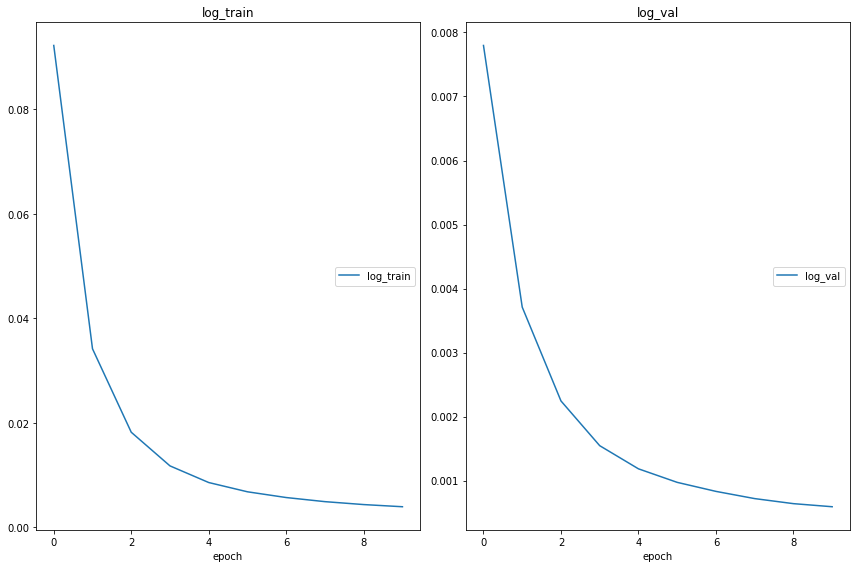

log_train
	log_train        	 (min:    0.004, max:    0.092, cur:    0.004)
log_val
	log_val          	 (min:    0.001, max:    0.008, cur:    0.001)


In [88]:
mnist_autoencoder = None # your model (re-assign below in solution part)
# YOU CAN CHOOSE YOUR BATCH SIZE (You can edit just the batch size)
torch_train_mnist = DataLoader(mnist_train_dataset,shuffle=True,batch_size=64,num_workers=1)
torch_validation_mnist = DataLoader(mnist_validation_dataset,shuffle=True,batch_size=64,num_workers=1)
mnist_optimizer = None # your optimizer (re-assign below in solution part)

liveloss = PlotLosses() # utility that you can optionally use to view losses live during training

#solution
mnist_autoencoder = AutoEncoder(64)
mnist_optimizer = optim.Adam(mnist_autoencoder.parameters(), lr=1e-3)

EPOCHS = 10

for epoch in range(EPOCHS):
  logs = {}
  for phase in ['train', 'val']:
    running_loss = 0

    if phase == 'train':
      for batch in torch_train_mnist:
        batch = batch.to(device)
        mnist_optimizer.zero_grad()
        
        outputs = mnist_autoencoder(batch)

        loss = reconstruction_loss(outputs, batch)
        loss.backward()

        mnist_optimizer.step()

        running_loss += loss.detach() * batch.size(0)

    else:
      for batch in torch_validation_mnist:
        batch = batch.to(device)
        outputs = mnist_autoencoder(batch)

        loss = reconstruction_loss(outputs, batch)


        running_loss += loss.detach() * batch.size(0)
    
    epoch_loss = running_loss / len(torch_train_mnist.dataset)
    logs['log_' + phase] = epoch_loss.item()
  liveloss.update(logs)
  liveloss.send()


#end_solution


Save trained model (needed for marking)

In [90]:
torch.save(mnist_autoencoder, "models/ex3b.pth")

Load trained model

In [ ]:
mnist_autoencoder = torch.load("models/ex3b.pth")

Showing, for 5 samples in the validation set, the input and the AE reconstruction, side-by-side.

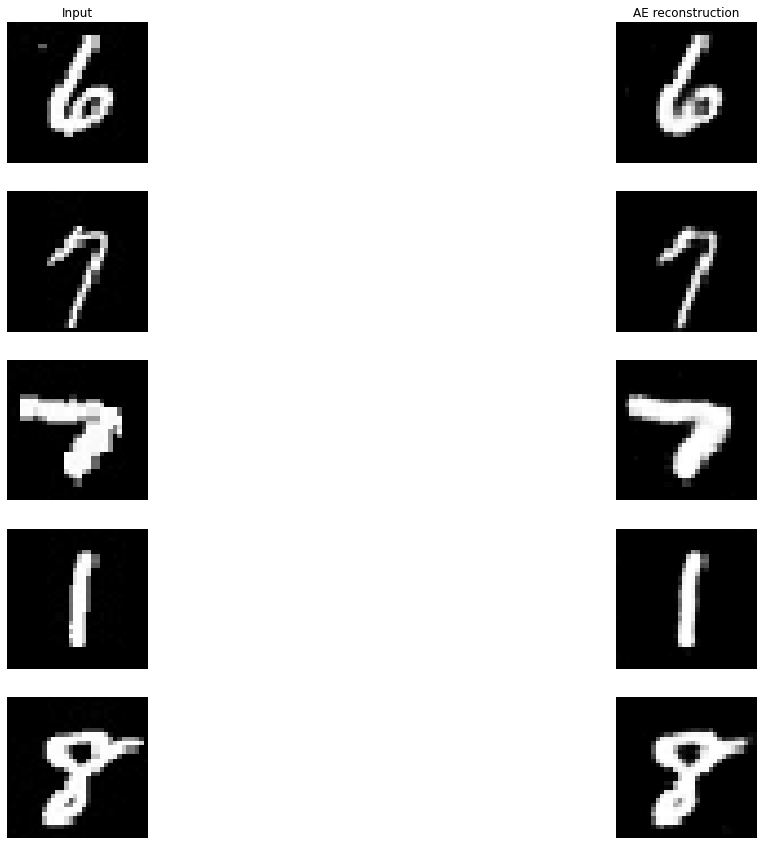

In [89]:
indices = np.random.choice(range(len(mnist_validation_dataset)), 5, replace=False)
mnist_random_images = [mnist_validation_dataset[idx] for idx in indices]
batch = torch.stack(mnist_random_images, dim=0)
gt_img = batch.to(device)

# run the autoencoder:
mnist_autoencoder.to(device).eval()
pred_img = mnist_autoencoder(gt_img)

# plot the images:
imgs_plot = [ el.cpu().squeeze().numpy() for el in gt_img]
pred_plot = [ el.cpu().detach().squeeze().numpy() for el in pred_img]

plot_images([imgs_plot, pred_plot], ["Input", "AE reconstruction"], None)
plt.show()
plt.close()

**Question 3.c**
<a name='question3c'></a>

Feel free to use the cell below to redefine (copy + edit) the AutoEncoder class if you are changing the architecture of your AutoEncoder Model for CelebA-HQ dataset.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [ ]:
#solution

#end_solution


Train the autoencoder on CelebA-HQ dataset

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

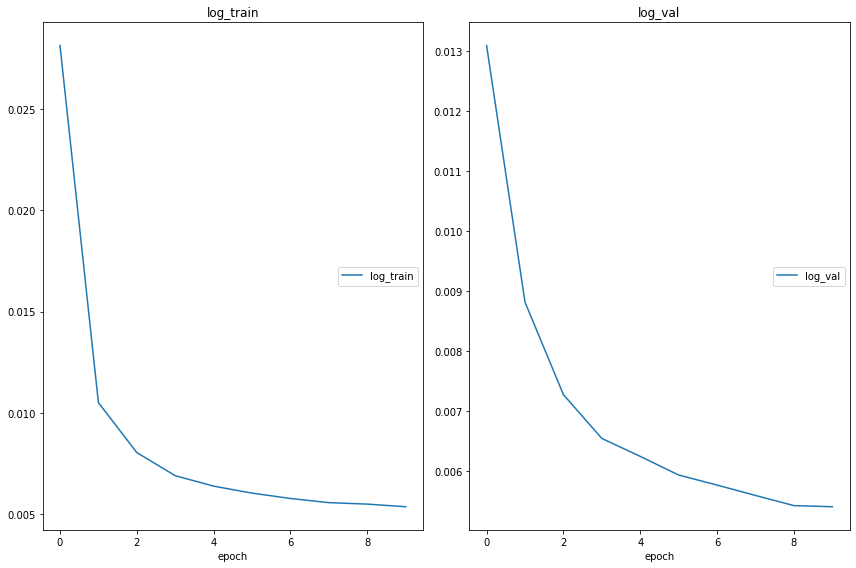

log_train
	log_train        	 (min:    0.005, max:    0.028, cur:    0.005)
log_val
	log_val          	 (min:    0.005, max:    0.013, cur:    0.005)


In [121]:
celeba_hq_autoencoder = None # your model (assign below)
# YOU CAN CHOOSE YOUR BATCH SIZE (You can edit just the batch size)
torch_train_celeba_hq = DataLoader(celeba_hq_train_dataset, shuffle=True, batch_size=64, num_workers=1)
torch_validation_celeba_hq = DataLoader(celeba_hq_validation_dataset, shuffle=True, batch_size=64, num_workers=1)
celeba_hq_optimizer = None # your optimizer (re-assign below in solution part)

liveloss = PlotLosses() # utility that you can optionally use to view losses live during training

#solution
celeba_hq_autoencoder = AutoEncoder(128, channel_size=3)
celeba_hq_optimizer = optim.Adam(celeba_hq_autoencoder.parameters(), lr=1e-3)

EPOCHS = 10

for epoch in range(EPOCHS):
  logs = {}
  for phase in ['train', 'val']:
    running_loss = 0

    if phase == 'train':
      for batch in torch_train_celeba_hq:
        batch = batch.to(device)
        celeba_hq_optimizer.zero_grad()

        outputs = celeba_hq_autoencoder(batch)

        loss = reconstruction_loss(outputs, batch)
        loss.backward()

        celeba_hq_optimizer.step()

        running_loss += loss.detach() * batch.size(0)

    else:
      for batch in torch_validation_celeba_hq:
        batch = batch.to(device)
        outputs = celeba_hq_autoencoder(batch)

        loss = reconstruction_loss(outputs, batch)


        running_loss += loss.detach() * batch.size(0)
    
    dataset_length = len(torch_train_celeba_hq.dataset)
    if phase == 'val':
      dataset_length = len(torch_validation_celeba_hq.dataset)
    epoch_loss = running_loss / dataset_length
    logs['log_' + phase] = epoch_loss.item()
  liveloss.update(logs)
  liveloss.send()
#end_solution


Save the trained model (Needed for marking)

In [123]:
torch.save(celeba_hq_autoencoder, "models/ex3c.pth")

Load the trained model

In [ ]:
celeba_hq_autoencoder = torch.load("models/ex3c.pth")

Showing for 5 samples in the validation set, the input and AE reconstruction, side-by-side.

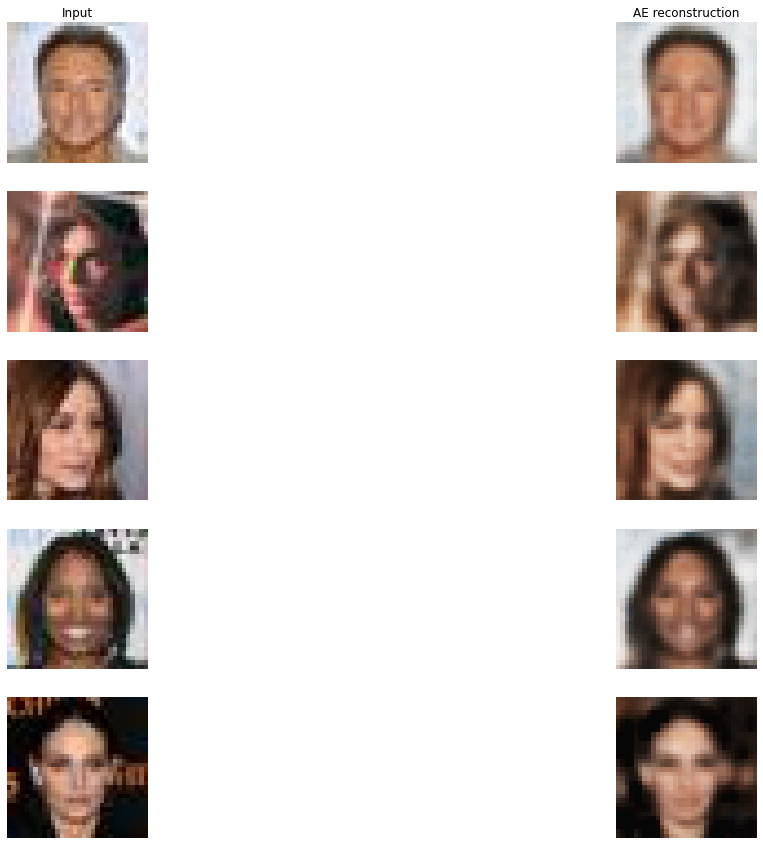

In [122]:
indices = np.random.choice(range(len(celeba_hq_validation_dataset)), 5, replace=False)
celeba_hq_random_images = [celeba_hq_validation_dataset[idx] for idx in indices]
batch = torch.stack(celeba_hq_random_images, dim=0)
gt_img = batch.to(device)

# run the autoencoder:
celeba_hq_autoencoder.to(device).eval()
pred_img = celeba_hq_autoencoder(gt_img)

# plot the images:
imgs_plot = [ el.cpu().permute(1, 2, 0).numpy() for el in gt_img]
pred_plot = [ el.cpu().detach().permute(1, 2, 0).numpy() for el in pred_img]

plot_images([imgs_plot, pred_plot], ["Input", "AE reconstruction"], None)
plt.show()
plt.close()

**Question 3.d**
<a name='question3d'></a>

Create the VAE class

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [106]:
class VAE(Module):

    def __init__(self, bottleneck_size, channel_size=1):
        super().__init__()
        self.bottleneck_size = bottleneck_size
        self.channel_size    = channel_size
        
        
        #solution
        self.conv1 = nn.Conv2d(self.channel_size, 16, kernel_size=3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(16)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv2 = nn.Conv2d(16, 8, kernel_size=3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(8)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.fc31 = nn.Linear(512, self.bottleneck_size)
        self.fc32 = nn.Linear(512, self.bottleneck_size)

        self.fc4 = nn.Linear(self.bottleneck_size, 512)

        # Decoder
        self.conv3 = nn.ConvTranspose2d(8, 16, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.bn3 = nn.BatchNorm2d(16)

        self.conv4 = nn.ConvTranspose2d(16, self.channel_size, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.bn4 = nn.BatchNorm2d(self.channel_size)
        self.sm = nn.Sigmoid()
        #end_solution

    
    def encoder(self,image):
        
        #solution
        x = self.pool1(self.bn1(torch.relu(self.conv1(image))))
        x = self.pool2(self.bn2(torch.relu(self.conv2(x))))
        x = x.view(-1, 8 * 8 * 8)
        mu, logvar = self.fc31(x), self.fc32(x)

        std = torch.exp(0.5 * logvar)

        #end_solution

        
        return mu, std
    
    def reparametrization_trick(self,mu,std):
        
        #solution

        eps = torch.randn_like(std)
        z = mu + eps * std

        #end_solution

        
        return z
    
    def decoder(self,code):
        #solution

        x = self.fc4(code)
        x = x.view(-1, 8, 8, 8)
        x = self.bn3(torch.relu(self.conv3(x)))
        x = self.bn4(torch.relu(self.conv4(x)))
        decoded_image = self.sm(x)

        #end_solution

        
        return decoded_image
    
    def forward(self, image):
        
        #solution
        mu, std = self.encoder(image)
        z = self.reparametrization_trick(mu, std)
        decoded_image = self.decoder(z)
        #end_solution

        
        return decoded_image, mu, std

In [ ]:
#begin_test

#end_test

Implement your vae losses below

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [97]:
def reconstruction_loss(prediction, target):
    
    #solution
    recon_loss = F.mse_loss(prediction, target, reduction='sum')
    #end_solution

    
    return recon_loss

def kl_divergence_loss(mu,std):
    
    #solution
    kl_loss = torch.sum(0.5 * (std**2 + mu**2 - 1 - std.log()))
    #end_solution

    
    return kl_loss

Train your VAE

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

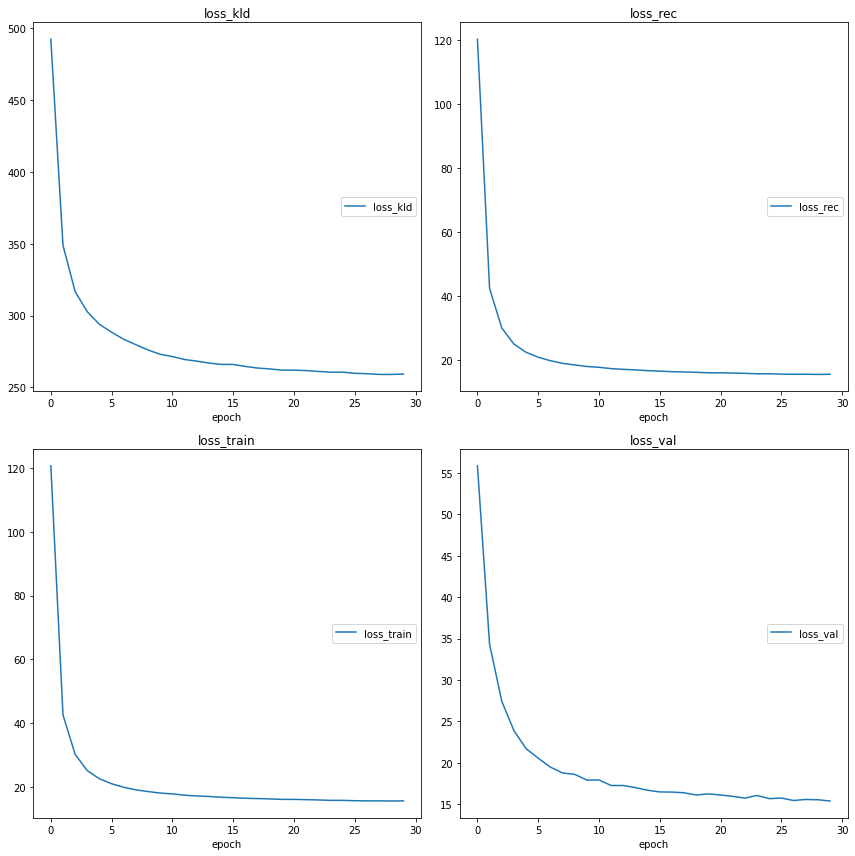

loss_kld
	loss_kld         	 (min:  258.978, max:  492.421, cur:  259.257)
loss_rec
	loss_rec         	 (min:   15.404, max:  120.306, cur:   15.457)
loss_train
	loss_train       	 (min:   15.648, max:  120.678, cur:   15.700)
loss_val
	loss_val         	 (min:   15.397, max:   55.864, cur:   15.397)


In [113]:
celeba_hq_vae = None # your model (assign it below)
# YOU CAN CHOOSE YOUR BATCH SIZE (You can edit just the batch size)
torch_train_celeba_hq = DataLoader(celeba_hq_train_dataset, shuffle=True, batch_size=128, num_workers=1)
torch_validation_celeba_hq = DataLoader(celeba_hq_validation_dataset, shuffle=True, batch_size=128, num_workers=1)
celeba_hq_vae_optimizer = None # your optimizer (re-assign below in solution part)

liveloss = PlotLosses() # utility that you can optionally use to view losses live during training


#solution
celeba_hq_vae = VAE(128, channel_size=3)
celeba_hq_vae_optimizer = optim.Adam(celeba_hq_vae.parameters(), lr=1e-3)

EPOCHS = 30

for epoch in range(EPOCHS):
  logs = {}
  for phase in ['train', 'val']:
    running_loss = 0
    running_kl_loss = 0
    running_rec_loss = 0

    if phase == 'train':
      for batch in torch_train_celeba_hq:
        batch = batch.to(device)
        celeba_hq_vae_optimizer.zero_grad()

        decoded, mu, std = celeba_hq_vae(batch)

        loss_rec = reconstruction_loss(decoded, batch)
        loss_kld = kl_divergence_loss(mu, std)

        loss = 0.999 * loss_rec + 0.001 * loss_kld
        loss.backward()

        celeba_hq_vae_optimizer.step()

        running_loss += loss.detach()
        running_rec_loss += loss_rec.detach()
        running_kl_loss += loss_kld.detach()

    else:
      for batch in torch_validation_celeba_hq:
        batch = batch.to(device)
        outputs, _, _ = celeba_hq_vae(batch)

        loss_rec = reconstruction_loss(outputs, batch)
        loss_kld = kl_divergence_loss(mu, std)
        loss = 0.999 * loss_rec + 0.001 * loss_kld


        running_loss += loss.detach()
    
    dataset_length = len(torch_train_celeba_hq.dataset)
    if phase == 'val':
      dataset_length = len(torch_validation_celeba_hq.dataset)
    epoch_loss = running_loss / dataset_length
    epoch_kld_loss = running_kl_loss / dataset_length
    epoch_rec_loss = running_rec_loss / dataset_length
    logs['loss_' + phase] = epoch_loss.item()
    if phase == 'train':
      logs['loss_kld'] = epoch_kld_loss.item()
      logs['loss_rec'] = epoch_rec_loss.item()
  liveloss.update(logs)
  liveloss.send()
#end_solution


Save model (needed for marking)

In [115]:
torch.save(celeba_hq_vae, "models/ex3d.pth")

Load pretrained model

In [ ]:
celeba_hq_vae = torch.load("models/ex3d.pth")

Reconstructions of the VAE model 5 samples from the validation dataset. Note we use the latent-code means for decoding the reconstruction.

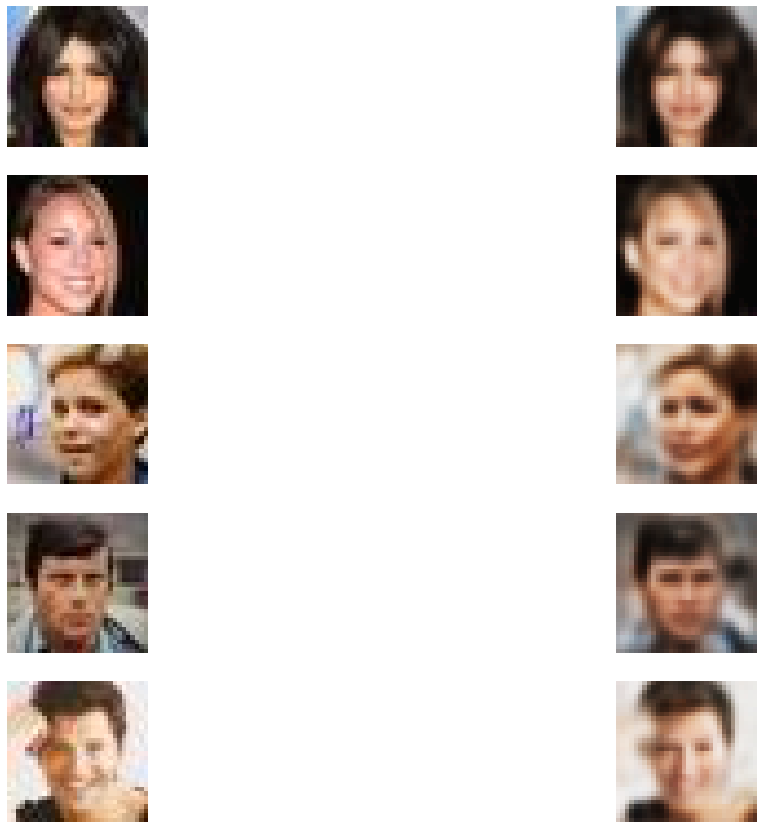

In [124]:
indices = np.random.choice(range(len(celeba_hq_validation_dataset)), 5, replace=False)
celeba_random_images = [celeba_hq_validation_dataset[idx] for idx in indices]


batch = torch.stack(celeba_random_images, dim=0)
gt_img = batch.to(device)

celeba_hq_vae.to(device).eval()
pred_img = celeba_hq_vae(gt_img)[0].permute(0,2,3,1)

imgs_plot = [ el.cpu().squeeze().numpy() for el in gt_img.permute(0,2,3,1)]
pred_plot = [ el.cpu().detach().squeeze().numpy() for el in pred_img]
img = [imgs_plot, pred_plot, ]
plot_images(img, None, None)
plt.show()
plt.close()

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

Show 10 Random samples drawn from the trained CelebA-HQ VAE. You can use the `plot_images` function provided to you.

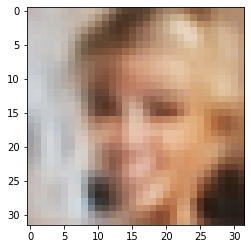

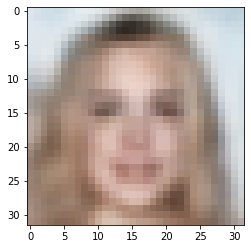

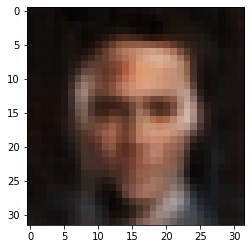

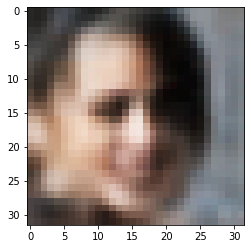

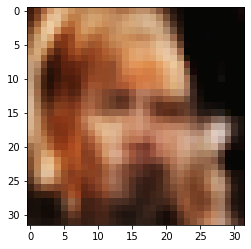

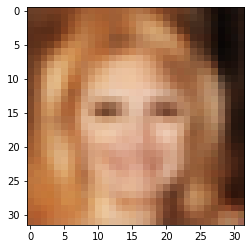

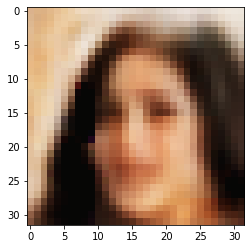

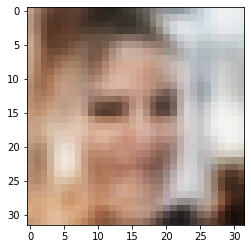

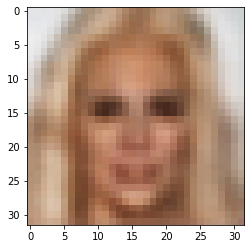

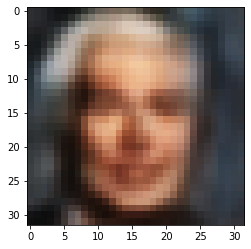

In [125]:
number_of_samples = 10


#solution
indices = np.random.choice(range(len(celeba_hq_train_dataset)), number_of_samples, replace=False)
celeba_random_images = [celeba_hq_train_dataset[idx] for idx in indices]


batch = torch.stack(celeba_random_images, dim=0)
gt_img = batch.to(device)

celeba_hq_vae.to(device).eval()
pred_img = celeba_hq_vae(gt_img)[0].permute(0,2,3,1)

pred_plot = [ el.cpu().detach().squeeze().numpy() for el in pred_img]

for pred in pred_plot:
  plt.imshow(pred)
  plt.show()
#end_solution


**Question 3.e**
<a name='question3e'></a>

i. Compare the reconstruction performance of AE v/s VAE by plotting reconstructions (i.e. G.T | A.E. reconstruction | VAE reconstruction) side by side for 5 samples from the validation split of CelebA-HQ.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

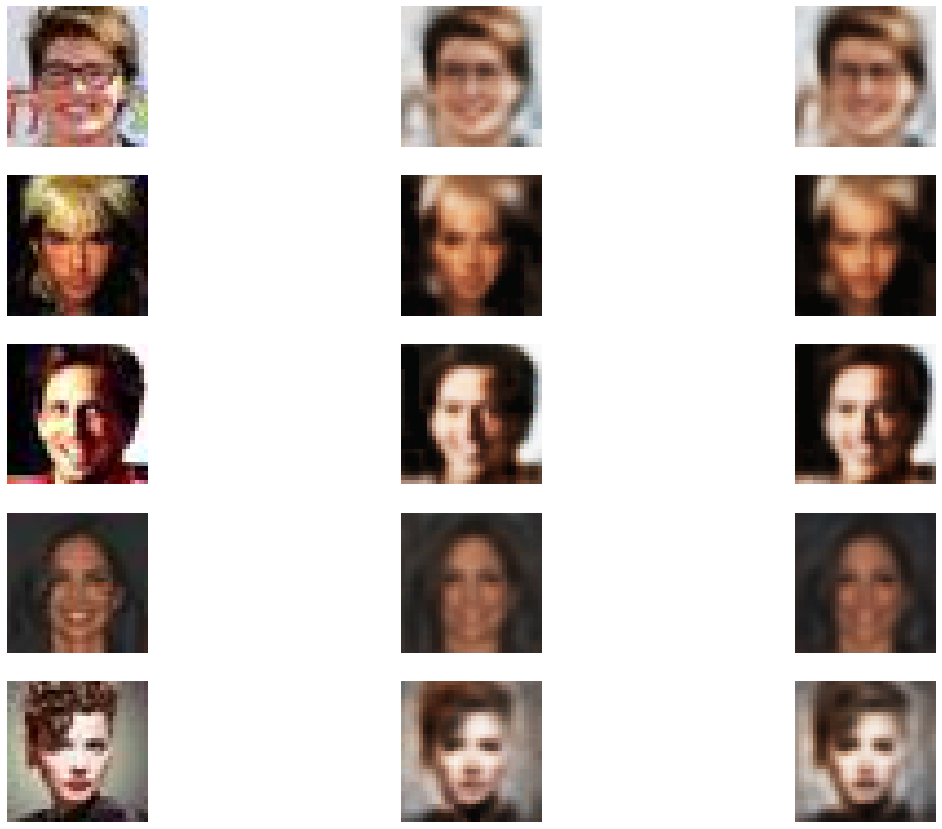

In [194]:
#solution
indices = np.random.choice(range(len(celeba_hq_train_dataset)), 5, replace=False)
celeba_random_images = [celeba_hq_train_dataset[idx] for idx in indices]


batch = torch.stack(celeba_random_images, dim=0)
gt_img = batch.to(device)

celeba_hq_autoencoder.to(device).eval()
celeba_hq_vae.to(device).eval()

pred_ae_img = celeba_hq_autoencoder(gt_img).permute(0,2,3,1)
pred_vae_img = celeba_hq_vae(gt_img)[0].permute(0,2,3,1)

imgs_plot = [ el.cpu().squeeze().numpy() for el in gt_img.permute(0,2,3,1)]
pred_ae_plot = [ el.cpu().detach().squeeze().numpy() for el in pred_ae_img]
pred_vae_plot = [ el.cpu().detach().squeeze().numpy() for el in pred_vae_img]
img = [imgs_plot, pred_ae_plot, pred_vae_plot, ]
plot_images(img, None, None)
plt.show()
plt.close()

# As observed below, the images from the autoencoder look almost identical to the ones
# resulted from the vae

#end_solution


ii. Compare the quality of generations by randomly sampling 5 samples from the latent space of the AE and the VAE and plotting them side by side. 
**Note: Do independent research and use appropriate mechanism to sample from the bottleneck space of the AE.**

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

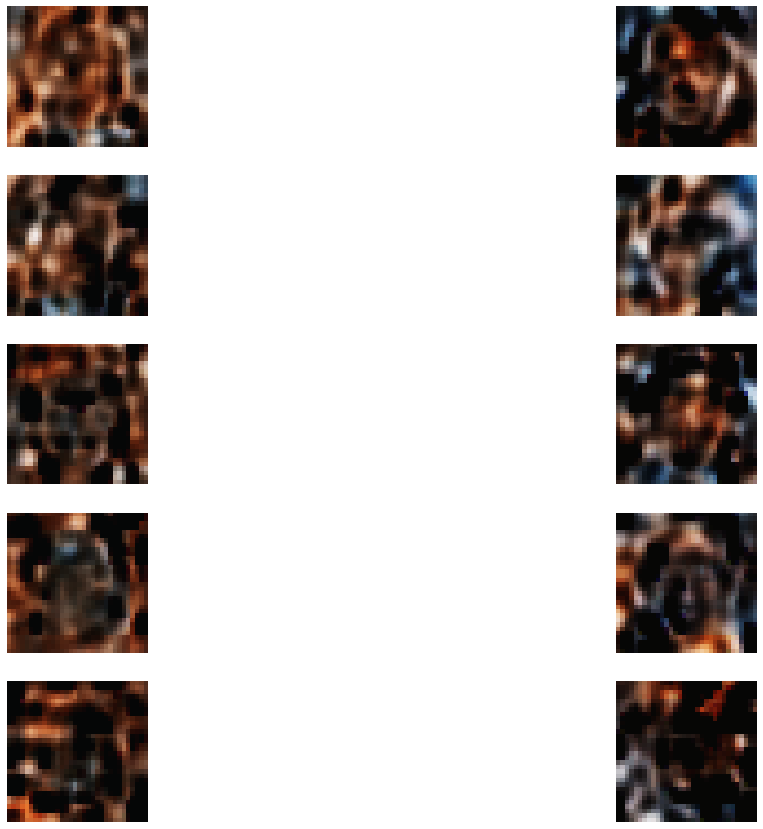

In [196]:
#solution
latent_space = torch.randn(5, 128).to(device)

celeba_hq_autoencoder.to(device).eval()
celeba_hq_vae.to(device).eval()

pred_ae_img = celeba_hq_autoencoder.decoder(latent_space).permute(0,2,3,1)
pred_vae_img = celeba_hq_vae.decoder(latent_space).permute(0,2,3,1)

pred_ae_plot = [ el.cpu().detach().squeeze().numpy() for el in pred_ae_img]
pred_vae_plot = [ el.cpu().detach().squeeze().numpy() for el in pred_vae_img]
img = [pred_ae_plot, pred_vae_plot, ]
plot_images(img, None, None)
plt.show()
plt.close()

# An observation is that from sampling from latent space, the VAE is shaping
# good characteristics of a persons face, whereas the results of the AE
# do not look like human faces. The latent space for VAE looks like is training
# on how a latent space for face reconstruction should look like.

#end_solution


**Question 3.f**
<a name='question3f'></a>

In your own words, describe your design choices for Q3a. and Q3d. This can include:
1. The architectures you used for the Encoder and Decoder in both
2. The hyperparams used for training, etc.

Explain how and why the models are different? Write no more than 15 sentences and feel free to use figures/plots/math(latex) for explanation.

&#9998; <font color="#0047AB">
1. For both AE and VAE i tried to use the same encoding and decoding layers in order to make a rigurous comparison between the 2 models at the end of the training. <br>
Needing to learn the features of an image i naturally opted for convolutional layers instead of linear ones. After every convolution I used a relu activation to maintain the values in the [0, 1] interval, followed by a batchnorm normalization and a max pool layer to reduce the dimension of the image in order to encode. <br> For the AE, after reducing the image I flatten it to a (1, bottleneck_size) bottleneck, which I am further decoding by reversing every layer applied so far. <br>However, for the VAE instead of calculating a single bottleneck, I calculate bottleneck_size normal distributions with medians and variance that I determine by applying a linear transformation to the flattened image. Further, data is sampled from this distributions and noise is added accordingly. This data is then used as input for the decoder of the VAE which is similar to the decoder of AE. At the end, for both AE and VAE a sigmoid layer in applied to maintain the values in the [0, 1] interval. <br>

2. After testing with multiple hyperparametes, I got the best loss for the models with 128 latent space size and a learning rate of 0.001. I wanted to have the same parameters to both of the models in order to make a better comparison. More features inside the latent space would be redundant, and fewer features may lead to more imprecise results.

The differences between the implementations is that while AE encodes the image to a bottleneck and decodes this bottleneck, the VAE encodes the image into a normal distribution, samples from this distribution, adds noise and then use this data to decode the image. <br>
Another difference is that the VAE is trying to learn a continuous latent space based on probabilities, while AE has a discrete latent space. Therefore, except for reconstructing the image, the VAE is also trying to store the image in a latent space structured and decipherable.
</font>

_Your reply:_ 